<a href="https://colab.research.google.com/github/Manwi23/Hello-Darkness/blob/main/Hello_darkness_project_raport.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The code in this notebook makes use of the files stored in https://github.com/Manwi23/Hello-Darkness github repository; please clone the repo and run this notebook there if you want to play with it yourself.

The goal of our project was to learn how to properly process images taken in too dark environment with short exposure time so that they resemble the ones taken with longer exposure.

Our first idea and the first U-net implementation was based on https://arxiv.org/pdf/1805.01934.pdf. We also used a part of the same dataset as the authors of this paper (namely images taken with Sony camera).

We have 3 different neural nets trained:
- U-net
- Res-net
- Conv-net

The nets are of similar sizes, so the main difference between them are the residual-like connections, which are either non-present (Conv-net) or they are placed to bypass either a few consecutive layers (Res-net) or a growing share of the layers, obtaining the last bypass nearly from the very beginning to the very end (U-net).
We have all the nets trained with both L1 and L2 losses.

In the other notebook: https://github.com/Manwi23/Hello-Darkness/blob/main/libraw.ipynb
you can find some 'traditional' way of RAW image processing, just to show a subset of things out nets needed to learn in order to process the images.

In [ ]:
import torch
from torch import nn

from Unet import U_net
from ConvDeconv import ConvDeconv
from Resnet import ResNet
from test_net import test_sony
from plotting_functions import *

In [ ]:
train_log_path = '.\models'

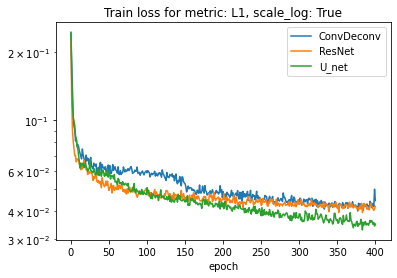

In [ ]:
plot_train_loss_for_metric('L1', train_log_path)

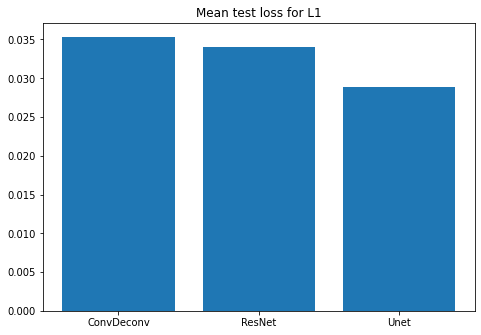

In [ ]:
plot_mean_test_loss('L1', nn.L1Loss(reduction='mean'))

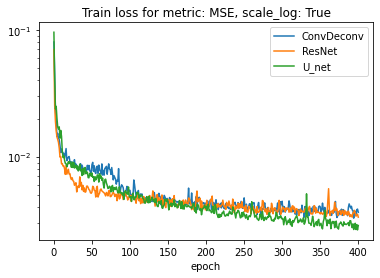

In [ ]:
plot_train_loss_for_metric('MSE', train_log_path)

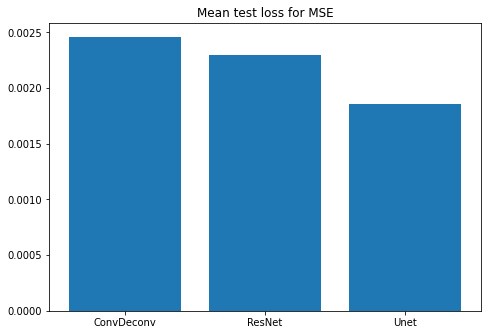

In [ ]:
plot_mean_test_loss('MSE', nn.MSELoss(reduction='mean'))

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

Below you can see the outputs of all three models with all the losses. You can always see there the short exposure image, the corresponding long one, model output (feed with the short exposure image), and the image got from rawpy library processing, scaled to have the the same mean as the long exposure one (so a kind of a naïve processing).

The long exposure image is obtained from the RAW one using basic processing with rawpy library, using the default parameters to convert RAW image to png format.

### Unet, L1

This is the best net among all three; it was the best one both with L1 and L2 loss.

Apart from the loss, its output also seems to correctly capture the coloring, turning the yellowish or reddish images to more natural looking ones. We suspect this is thanks to the fact, that there are these residual connections between near-beginning to near-end, so the net could faster learn that the 4 layers at the beginning are somehow associated with the 3 output layers.

In [ ]:
loss_fun = nn.L1Loss(reduction='mean')
loss_name = 'L1'
model_name = 'U_net'

In [ ]:
model_loss, order, ratio_order = test_sony(device, model_name=U_net, saved_model_param='models/Sony/U_net-L1Loss.pth', loss=loss_fun, loss_name=loss_name, locator='cpu')

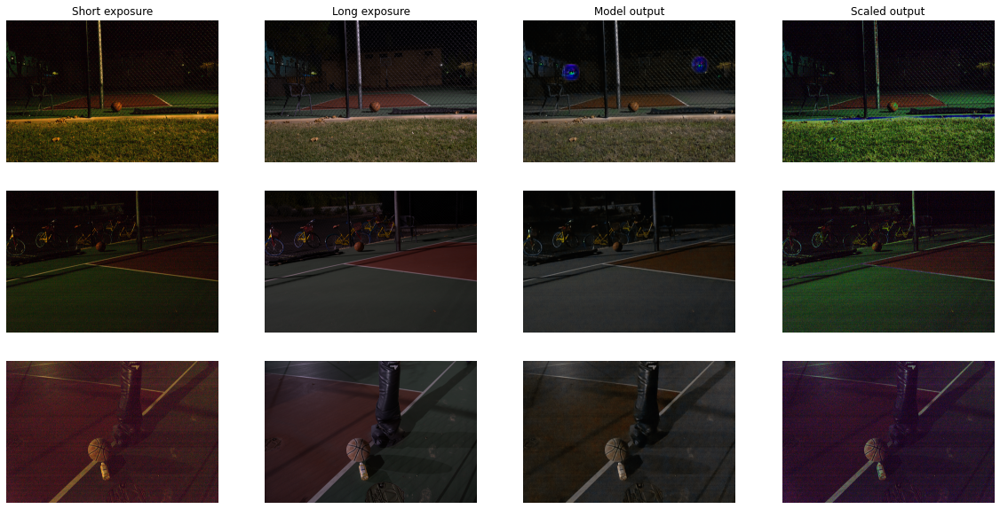

In [ ]:
plot_k_model_outputs(model=model_name, metric=loss_name, k=3)

The plot below presents the loss between short and long exposure image, model output and long exposure image and between scaled output and long exposure image.

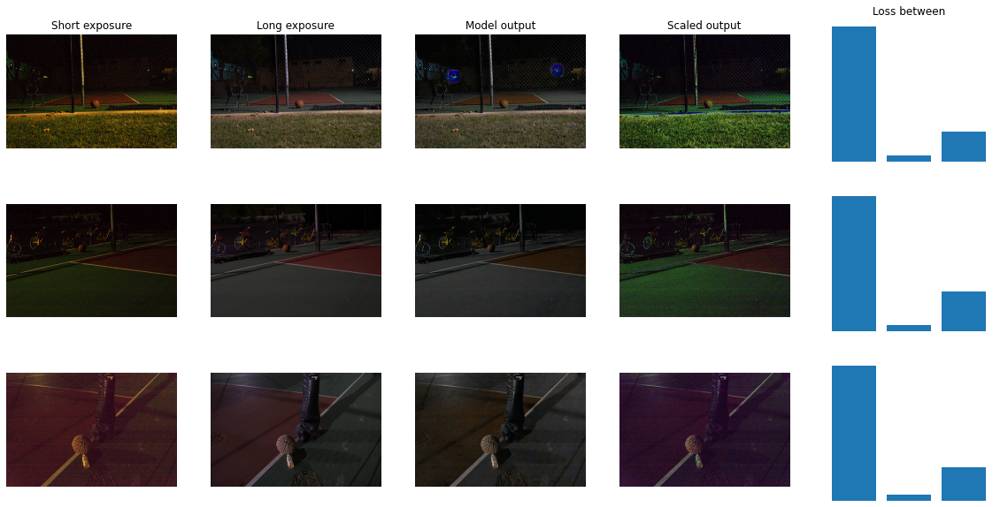

In [ ]:
plot_k_model_outputs_with_loss(model=model_name, metric=loss_name, k=3, loss=loss_fun)

Here one can see losses obtained on the test set, along with the images with the lowest and the highest loss. The radio mentioned in the plot title is the ratio between short and long exposure times in the corresponding sample.

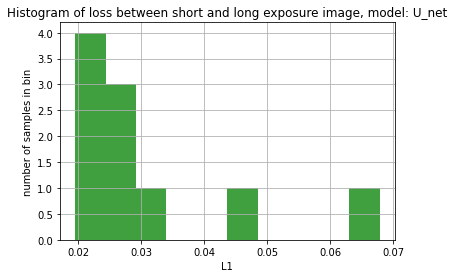

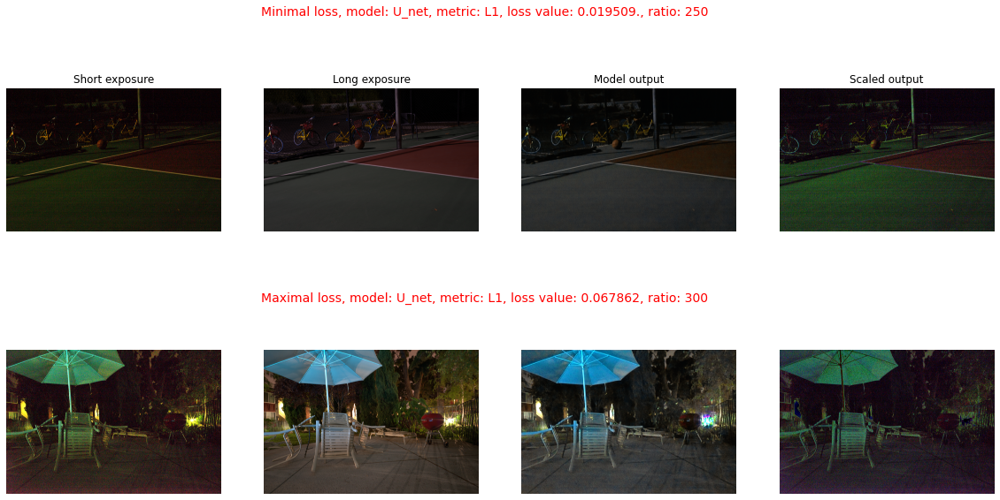

In [ ]:
plot_test_info(model_name, loss_name, model_loss, order, ratio_order)

### Unet, MSE

In [ ]:
loss_fun = nn.MSELoss(reduction='mean')
loss_name = 'MSE'
model_name = 'U_net'

In [ ]:
model_loss, order, ratio_order = test_sony(device, model_name=U_net, saved_model_param='models/Sony/U_net-MSELoss.pth', loss=loss_fun, loss_name=loss_name, locator='cpu')

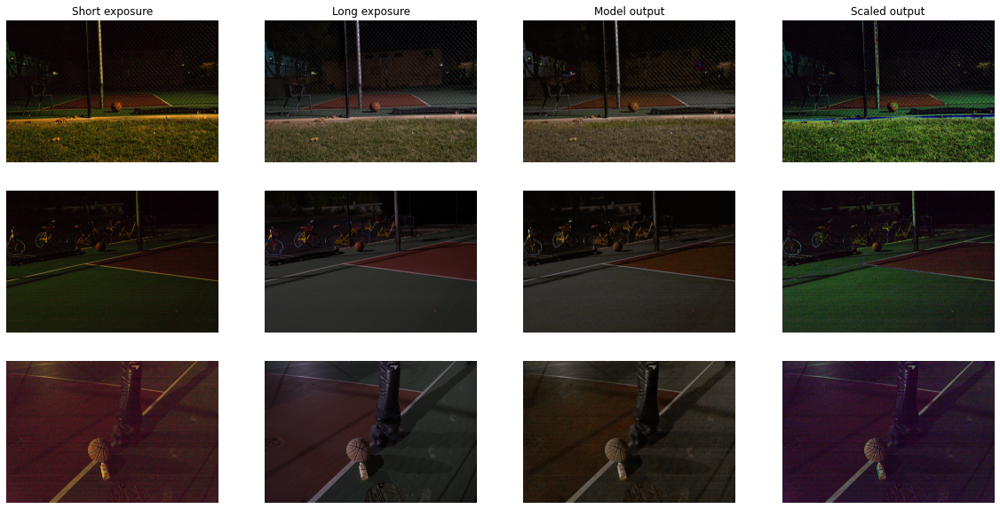

In [ ]:
plot_k_model_outputs(model=model_name, metric=loss_name, k=3)

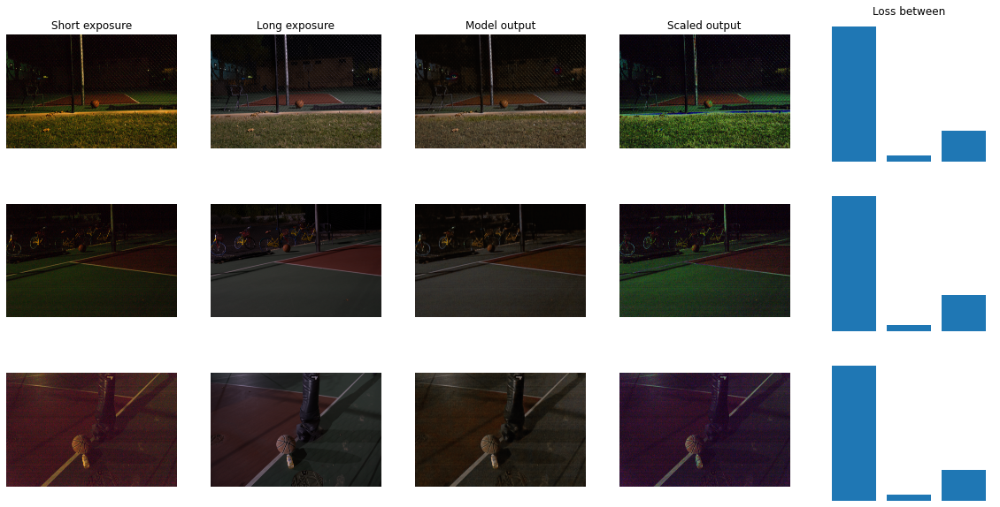

In [ ]:
plot_k_model_outputs_with_loss(model=model_name, metric=loss_name, k=3, loss=loss_fun)

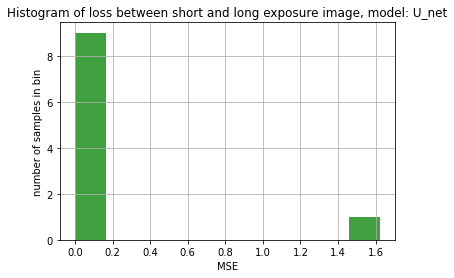

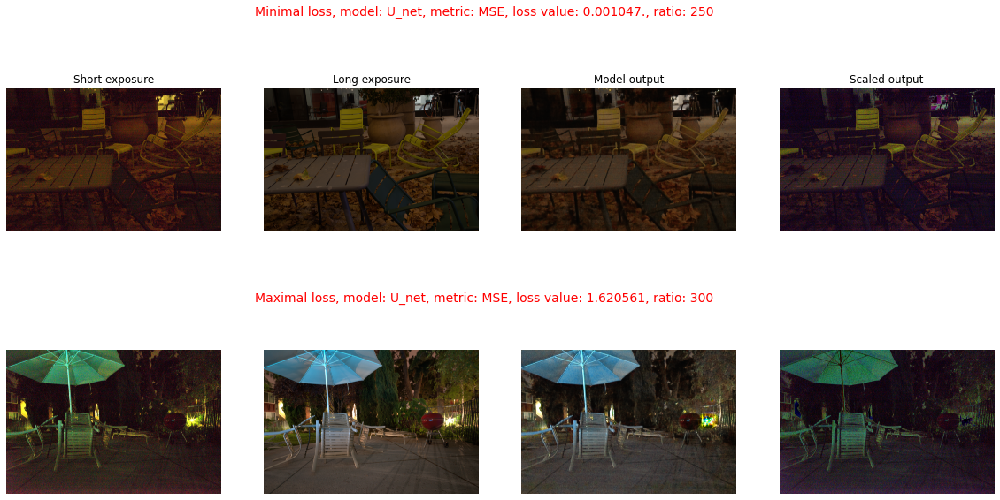

In [ ]:
plot_test_info(model_name, loss_name, model_loss, order, ratio_order)

### Resnet, L1

Res-net was a bit better than Conv-net in the end, distinguishing proper colors a bit better, but it still is not even close to U-net performance.

In [ ]:
loss_fun = nn.L1Loss(reduction='mean')
loss_name = 'L1'
model_name = 'ResNet'

In [ ]:
model_loss, order, ratio_order = test_sony(device, model_name=ResNet, saved_model_param='models/Sony/ResNet-L1Loss.pth', loss=loss_fun, loss_name=loss_name, locator='cpu')

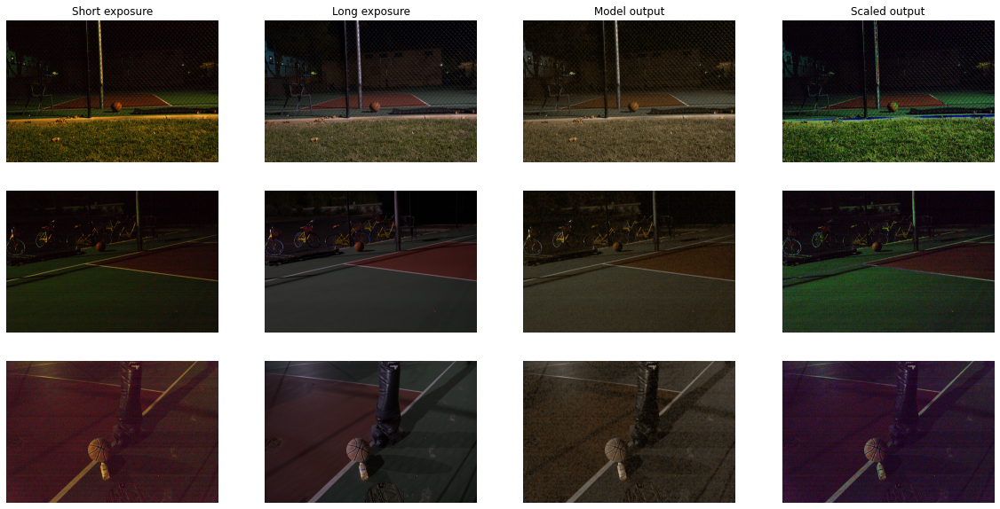

In [ ]:
plot_k_model_outputs(model=model_name, metric=loss_name, k=3)

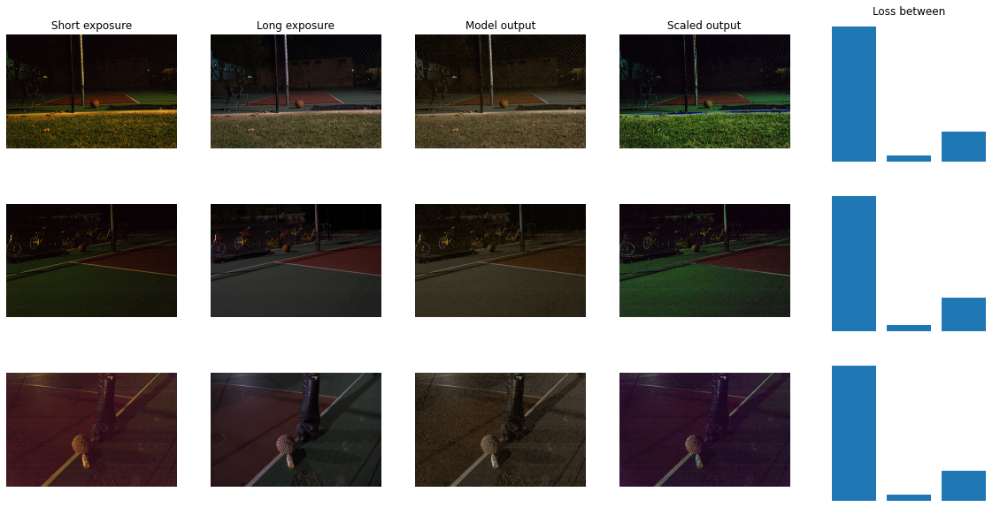

In [ ]:
plot_k_model_outputs_with_loss(model=model_name, metric=loss_name, k=3, loss=loss_fun)

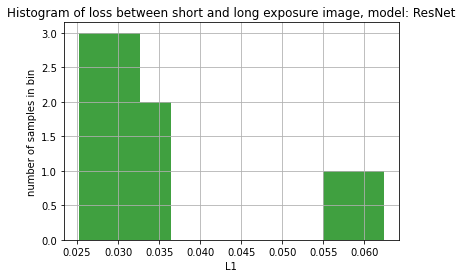

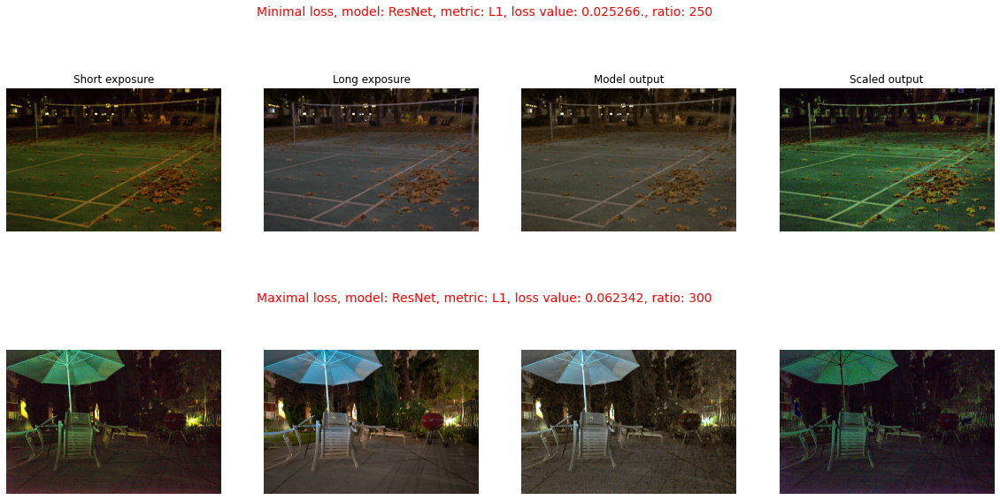

In [ ]:
plot_test_info(model_name, loss_name, model_loss, order, ratio_order)

### Resnet, MSE

In [ ]:
loss_fun = nn.MSELoss(reduction='mean')
loss_name = 'MSE'
model_name = 'ResNet'

In [ ]:
model_loss, order, ratio_order = test_sony(device, model_name=ResNet, saved_model_param='models/Sony/ResNet-MSELoss.pth', loss=loss_fun, loss_name=loss_name, locator='cpu')

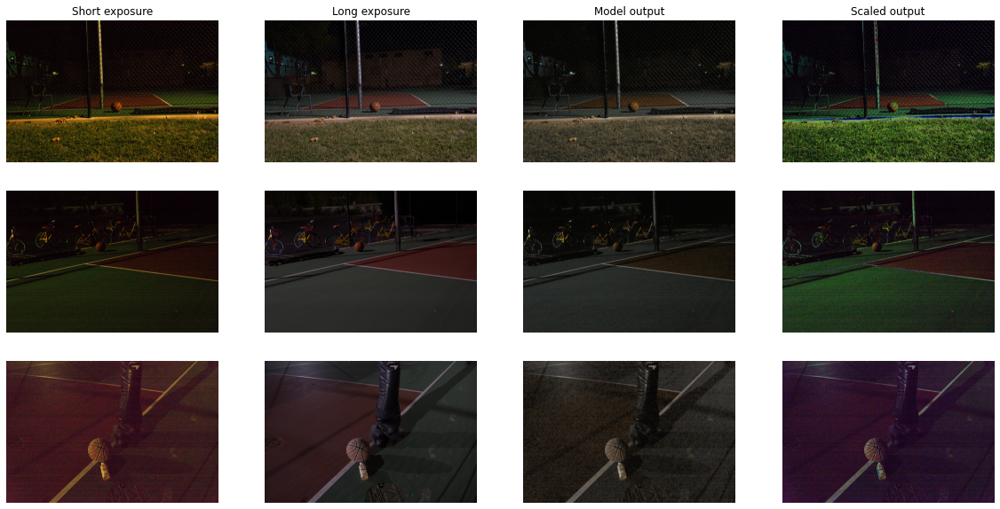

In [ ]:
plot_k_model_outputs(model=model_name, metric=loss_name, k=3)

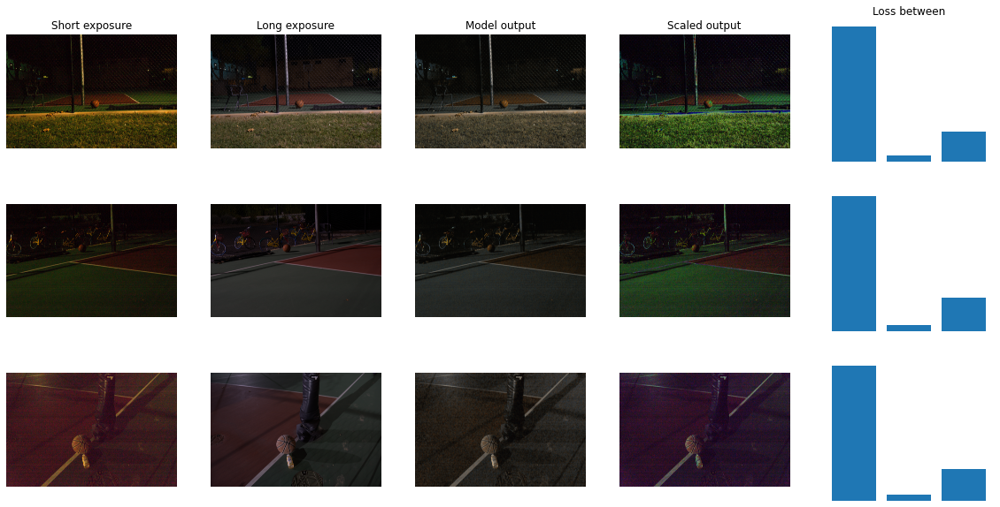

In [ ]:
plot_k_model_outputs_with_loss(model=model_name, metric=loss_name, k=3, loss=loss_fun)

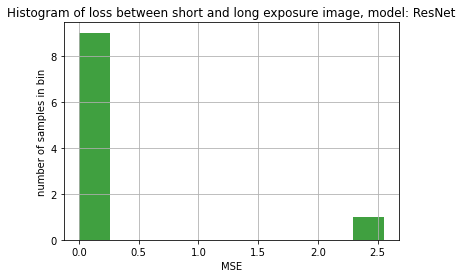

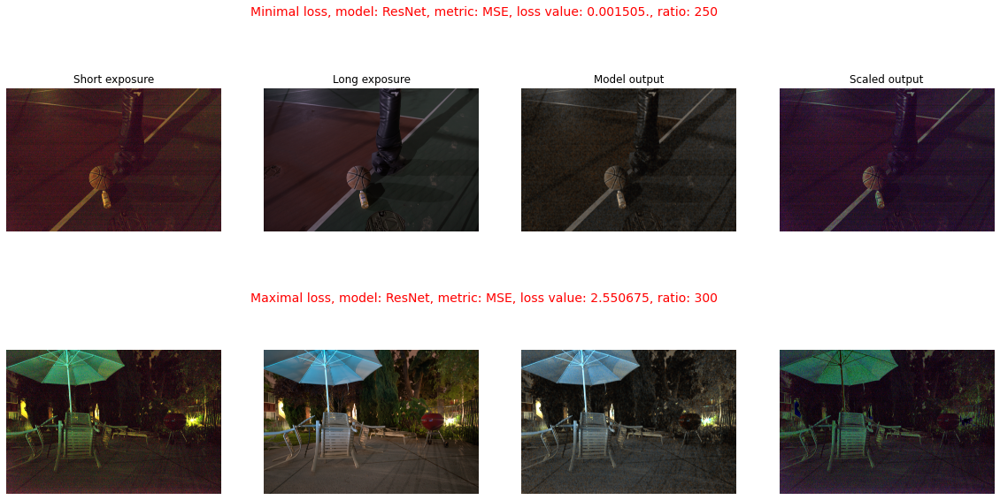

In [ ]:
plot_test_info(model_name, loss_name, model_loss, order, ratio_order)

### ConvDeconv, L1

Conv-net was the was on par with Res-net on the train set, although it's performace on the test set was a bit worse. It also had some problems with learning the proper coloring, being only able to set the proper mean amount of light (so colors' mean value), so that the final images look a bit gray.

In [ ]:
loss_fun = nn.L1Loss(reduction='mean')
loss_name = 'L1'
model_name = 'ConvDeconv'

In [ ]:
model_loss, order, ratio_order = test_sony(device, model_name=ConvDeconv, saved_model_param='models/Sony/ConvDeconv-L1Loss.pth', loss=loss_fun, loss_name=loss_name, locator='cpu')

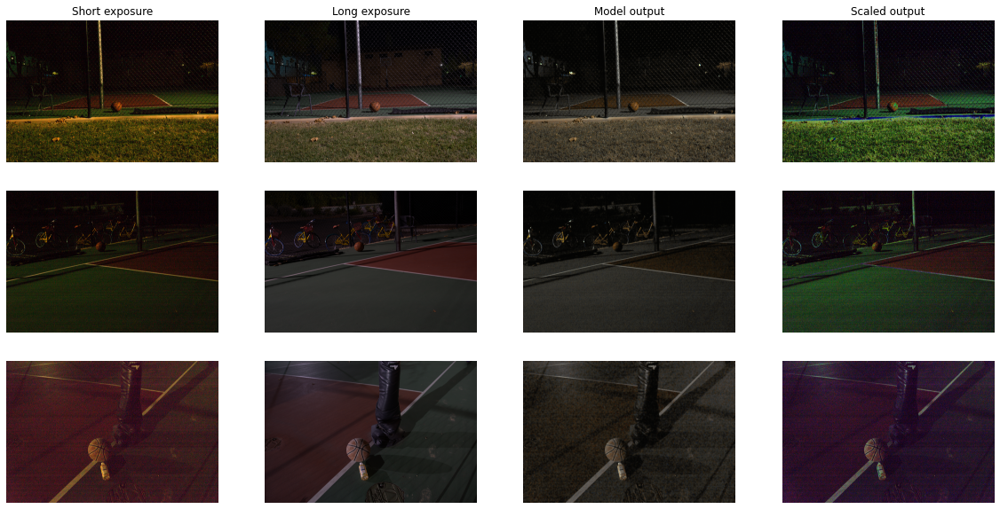

In [ ]:
plot_k_model_outputs(model=model_name, metric=loss_name, k=3)

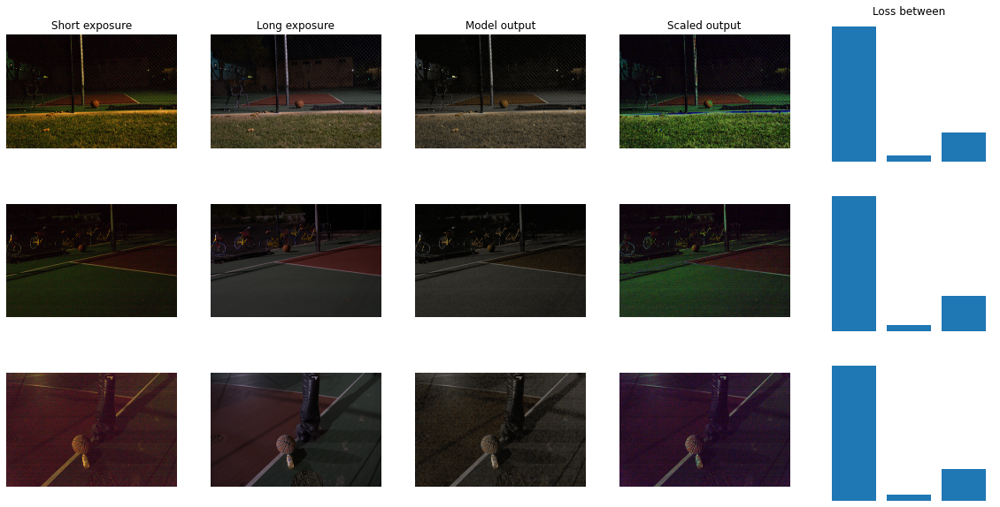

In [ ]:
plot_k_model_outputs_with_loss(model=model_name, metric=loss_name, k=3, loss=loss_fun)

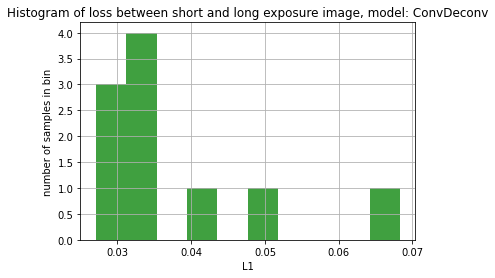

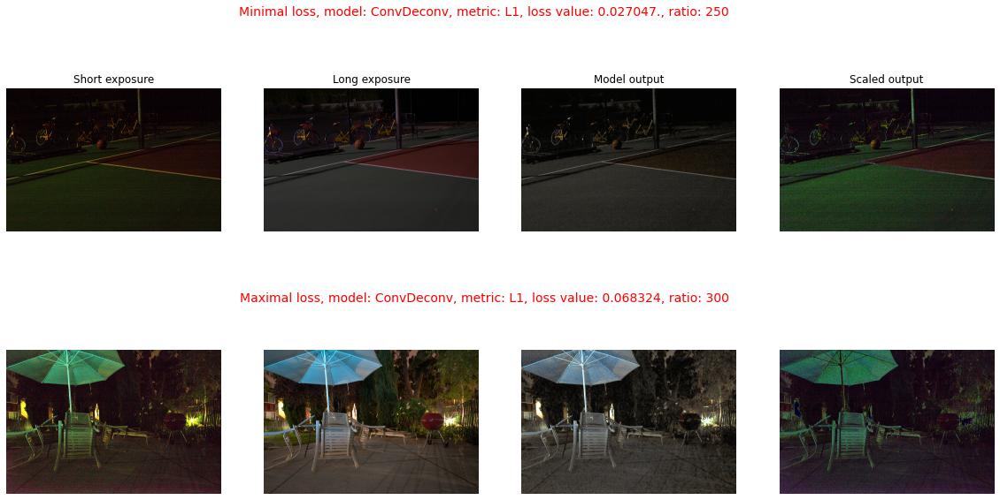

In [ ]:
plot_test_info(model_name, loss_name, model_loss, order, ratio_order)

### ConvDeconv, MSE

In [ ]:
loss_fun = nn.MSELoss(reduction='mean')
loss_name = 'MSE'
model_name = 'ConvDeconv'

In [ ]:
model_loss, order, ratio_order = test_sony(device, model_name=ConvDeconv, saved_model_param='models/Sony/ConvDeconv-MSELoss.pth', loss=loss_fun, loss_name=loss_name, locator='cpu')

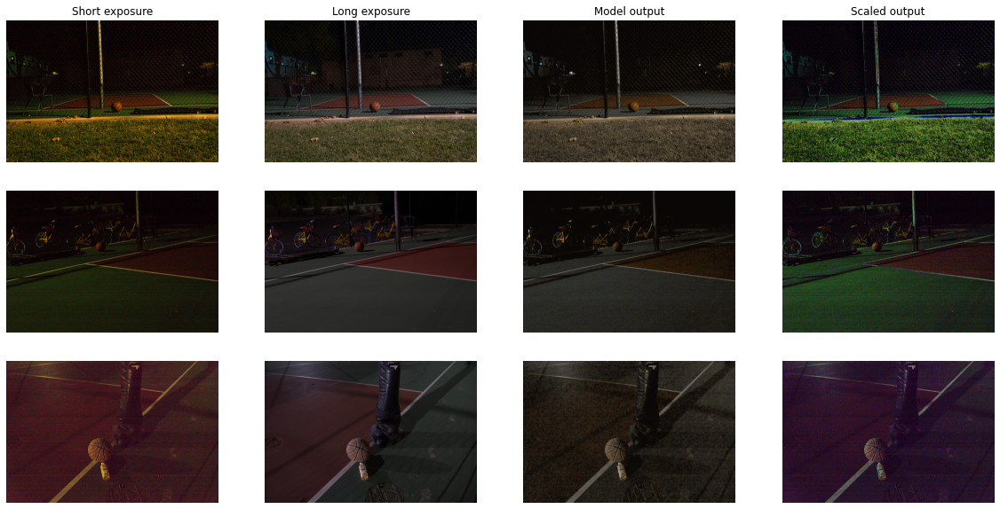

In [ ]:
plot_k_model_outputs(model=model_name, metric=loss_name, k=3)

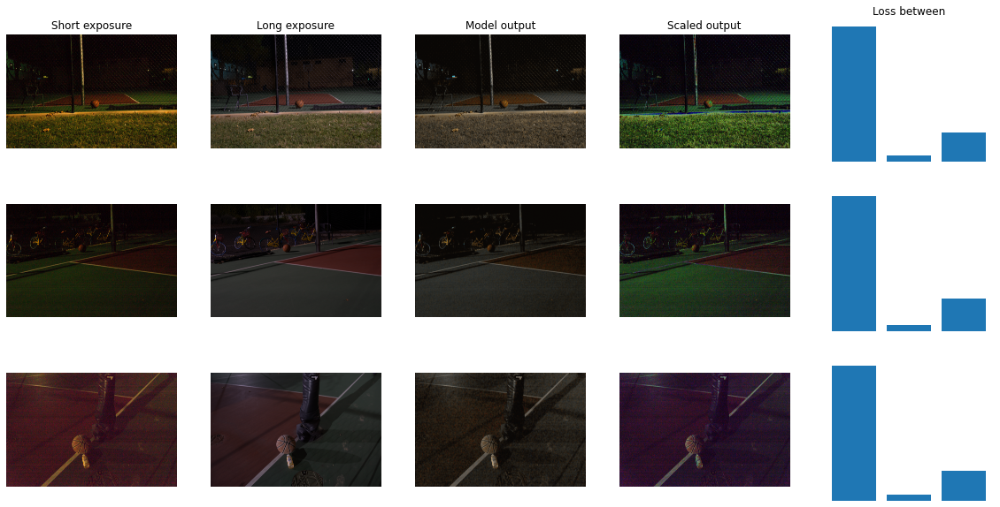

In [ ]:
plot_k_model_outputs_with_loss(model=model_name, metric=loss_name, k=3, loss=loss_fun)

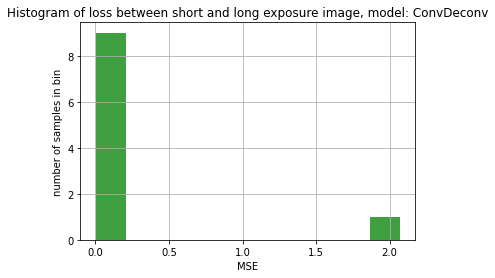

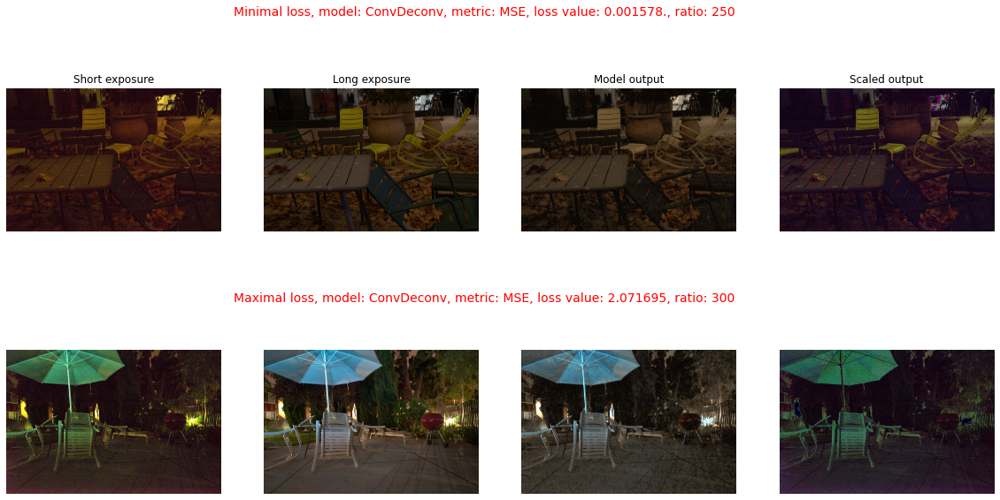

In [ ]:
plot_test_info(model_name, loss_name, model_loss, order, ratio_order)

### Compare models outputs

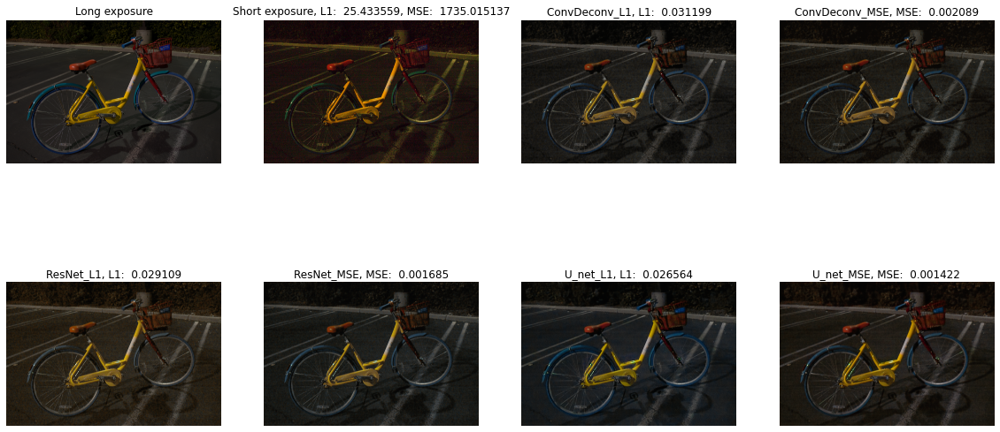

In [ ]:
compare_models_outputs('10016')

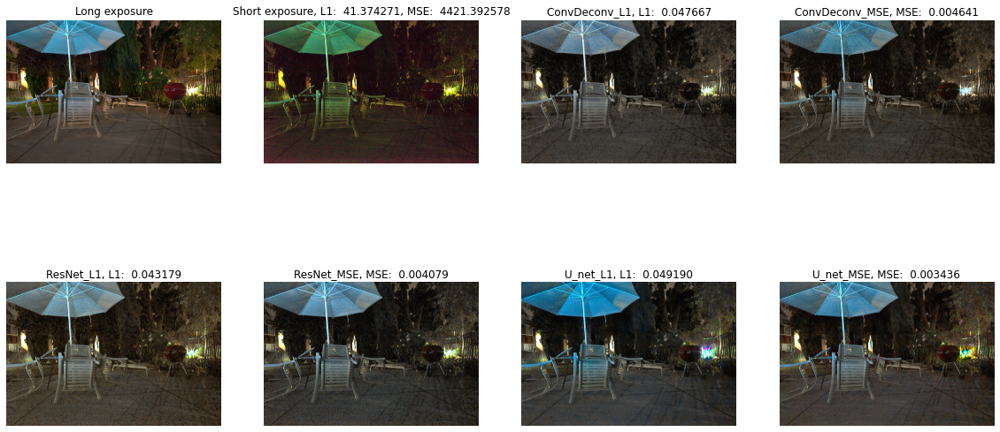

In [ ]:
compare_models_outputs('10106')

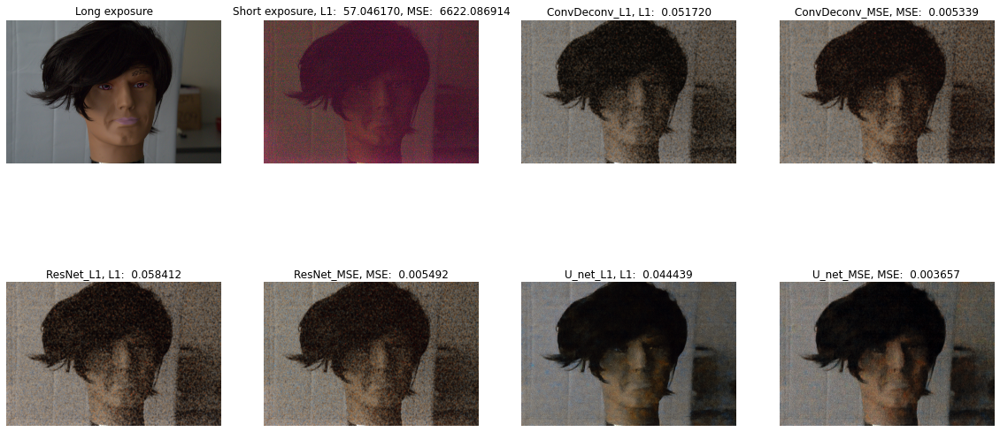

In [ ]:
compare_models_outputs('10191')